<a href="https://colab.research.google.com/github/GiovanniTRA/text-to-taste/blob/main/object_detection_for_menu_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection For Menu extraction

This notebook runds object detection on Aria recordings where user is looking at the menu. The notebooks processes the video to extract a frame where the menu is shown with the best quality.

### Notebook stuck?
Note that because of Jupyter issues, sometimes the code may stuck at visualization. We recommend **restart the kernels** and try again to see if the issue is resolved.

## Step 1. Install Project Aria Tools
Run the following cell to install Project Aria Tools for reading Aria recordings in .vrs format

In [ ]:
# Specifics for Google Colab
google_colab_env = 'google.colab' in str(get_ipython())
print("Running from Google Colab, installing projectaria_tools")
!pip install projectaria-tools

## Step 2. Prepare an Aria recording

We will set the vrsfile path to your collected Aria recording.

Upload your Aria recording in your Google Drive before running the cell.

*(You can check the content of the mounted drive by running `!ls "/content/drive/My Drive/"` in a cell.)*



In [ ]:
from google.colab import drive
import os, sys
drive.flush_and_unmount()
drive.mount('/content/drive/')
my_vrs_file_path = 'AriaProject_Text-to-Taste/recordings/Polish3.vrs'
vrsfile = "/content/drive/My Drive/" + my_vrs_file_path
print(f"INFO: vrsfile set to {vrsfile}")

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive/
INFO: vrsfile set to /content/drive/My Drive/AriaProject_Text-to-Taste/recordings/Polish3.vrs


## Tip: Avoid re-installation of packages
Follow the below steps to avoid re-installation of package due to Colab shutting off or restarts later when running the scripts.

(1) Create a folder called “ColabNotebooks” manually in your Drive (under "My Drive").

(2) Then, run the below cell to add the symlink path to the system path.

In [ ]:
# Commented out becasue of error

# This step is to save package
# nb_path = '/content/notebooks'
# os.symlink('/content/drive/My Drive/ColabNotebooks', nb_path)
# sys.path.insert(0,nb_path)

## Step 3. Create data provider

Create projectaria data_provider so you can load the content of the vrs file.

In [ ]:
from projectaria_tools.core import data_provider, calibration
from projectaria_tools.core.sensor_data import TimeDomain, TimeQueryOptions
from projectaria_tools.core.stream_id import RecordableTypeId, StreamId
import numpy as np
from matplotlib import pyplot as plt

print(f"Creating data provider from {vrsfile}")
provider = data_provider.create_vrs_data_provider(vrsfile)
if not provider:
    print("Invalid vrs data provider")

Creating data provider from /content/drive/My Drive/AriaProject_Text-to-Taste/recordings/Polish3.vrs


## Step 4. Display VRS rgb content in thumbnail images

Goals:
- Summarize a VRS using 20 image side by side, to visually inspect the collected data.

Key learnings:
- Image streams are identified with a Unique Identifier: stream_id
- Image frames are identified with timestamps
- PIL images can be created from Numpy array

Customization
- To change the number of sampled images, change the variable `sample_count` to a desired number.
- To change the thumbnail size, change the variable `resize_ratio` to a desired value.

100%|██████████| 20/20 [00:02<00:00,  7.19it/s]


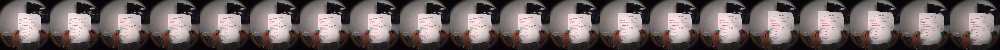

In [ ]:
from PIL import Image
from tqdm import tqdm
import cv2

sample_count = 20
resize_ratio = 10

rgb_stream_id = StreamId("214-1")

# Retrieve image size for the RGB stream
time_domain = TimeDomain.DEVICE_TIME  # query data based on host time
option = TimeQueryOptions.CLOSEST # get data whose time [in TimeDomain] is CLOSEST to query time

# Retrieve Start and End time for the given Sensor Stream Id
start_time = provider.get_first_time_ns(rgb_stream_id, time_domain)
end_time = provider.get_last_time_ns(rgb_stream_id, time_domain)

image_config = provider.get_image_configuration(rgb_stream_id)
width = image_config.image_width
height = image_config.image_height

thumbnail = newImage = Image.new(
    "RGB", (int(width * sample_count / resize_ratio), int(height / resize_ratio))
)
current_width = 0


# Samples 10 timestamps
sample_timestamps = np.linspace(start_time, end_time, sample_count)

for sample in tqdm(sample_timestamps):
    image_tuple = provider.get_image_data_by_time_ns(rgb_stream_id, int(sample), time_domain, option)
    image_array = image_tuple[0].to_numpy_array()
    image = Image.fromarray(image_array)

    new_size = (
        int(image.size[0] / resize_ratio),
        int(image.size[1] / resize_ratio),
    )
    image = image.resize(new_size).rotate(-90)


    thumbnail.paste(image, (current_width, 0))
    current_width = int(current_width + width / resize_ratio)


from IPython.display import Image
display(thumbnail)

## Step 5. Install DETIC
### Install Detectron2
Install Detectron2 as DETIC depends on Detectron2

In [ ]:
# Install detectron2
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# Use the below line to install detectron2 if the above one has an error
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git@v0.6'

### Install DETIC

In [ ]:
# clone and install Detic
!git clone https://github.com/facebookresearch/Detic.git --recurse-submodules
%cd Detic
!pip install -r requirements.txt

## Step 6. Load DETIC Model

### Set config for the model

Troubleshooting for running the following cell:
- Make sure you are currently in /content/Detic folder before running the following cell. (This is done by `%cd Detic` in the previous cell). You can check the current directory via running `!pwd`.
- Make sure your /content/Detic/third_party/CenterNet2/ is not empty.
- If you still face the problem, try change `sys.path.insert(0, 'third_party/CenterNet2/')` to `sys.path.insert(0, 'third_party/CenterNet2')`.

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import sys
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Detic libraries
sys.path.insert(0, 'third_party/CenterNet2/')
from centernet.config import add_centernet_config
from detic.config import add_detic_config
from detic.modeling.utils import reset_cls_test

# Build the detector and download our pretrained weights
cfg = get_cfg()
add_centernet_config(cfg)
add_detic_config(cfg)
cfg.merge_from_file("configs/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.yaml")
cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detic/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.ROI_BOX_HEAD.ZEROSHOT_WEIGHT_PATH = 'rand'
cfg.MODEL.ROI_HEADS.ONE_CLASS_PER_PROPOSAL = True # For better visualization purpose. Set to False for all classes.
# cfg.MODEL.DEVICE='cpu' # uncomment this to use cpu-only mode.
predictor = DefaultPredictor(cfg)


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth: 702MB [00:02, 235MB/s]                           


### Load DETIC Model

In [ ]:
# Setup the model's vocabulary using build-in datasets

BUILDIN_CLASSIFIER = {
    'lvis': 'datasets/metadata/lvis_v1_clip_a+cname.npy',
    'objects365': 'datasets/metadata/o365_clip_a+cnamefix.npy',
    'openimages': 'datasets/metadata/oid_clip_a+cname.npy',
    'coco': 'datasets/metadata/coco_clip_a+cname.npy',
}

BUILDIN_METADATA_PATH = {
    'lvis': 'lvis_v1_val',
    'objects365': 'objects365_v2_val',
    'openimages': 'oid_val_expanded',
    'coco': 'coco_2017_val',
}

vocabulary = 'lvis' # change to 'lvis', 'objects365', 'openimages', or 'coco'
metadata = MetadataCatalog.get(BUILDIN_METADATA_PATH[vocabulary])
classifier = BUILDIN_CLASSIFIER[vocabulary]
num_classes = len(metadata.thing_classes)
reset_cls_test(predictor.model, classifier, num_classes)

Resetting zs_weight datasets/metadata/lvis_v1_clip_a+cname.npy


# Calculating distance of the object from image center

This function calculates the distance for a given index of object and predictions from DETIC.

In [ ]:
import math

def get_distance(outputs_instances, idx):

  lst_obj = outputs_instances.pred_classes.tolist()

  indx = lst_obj.index(idx)
  bb_box = outputs_instances.pred_boxes[indx]
  bb_box = vars(bb_box)['tensor'].tolist()[0]
  x0 = bb_box[0]
  y0 = bb_box[1]

  x1 = bb_box[2]
  y1 = bb_box[3]
  x_c = int(x0 + (x1-x0) /2)
  y_c = int(y0 + (y1-y0) /2)
  dist_from_center = math.sqrt(pow((256-x_c),2) + pow((256-y_c),2))

  return dist_from_center

## Step 7. Run DETIC

Run DETIC for each sampled timestamps in Step 4. The detected object list will be stored in `objects_dict`.

You can set the image size using the `imsize` variable.

DETIC is an object detection model from FAIR.

"*Detecting Twenty-thousand Classes using Image-level Supervision*",
*Xingyi Zhou, Rohit Girdhar, Armand Joulin, Philipp Krähenbühl, Ishan Misra, ECCV 2022*
- Paper: https://arxiv.org/abs/2201.02605
- Code: https://github.com/facebookresearch/Detic

  0%|          | 0/20 [00:00<?, ?it/s]

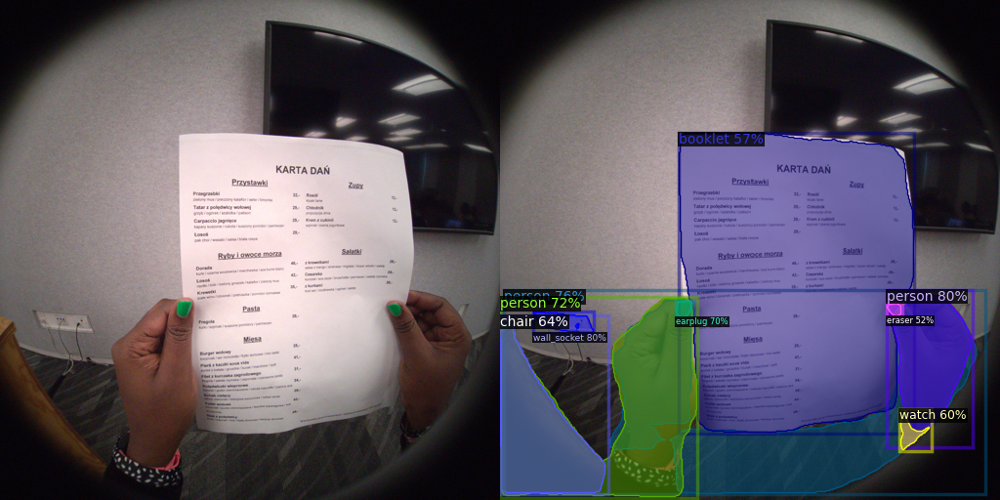

  5%|▌         | 1/20 [00:07<02:26,  7.70s/it]

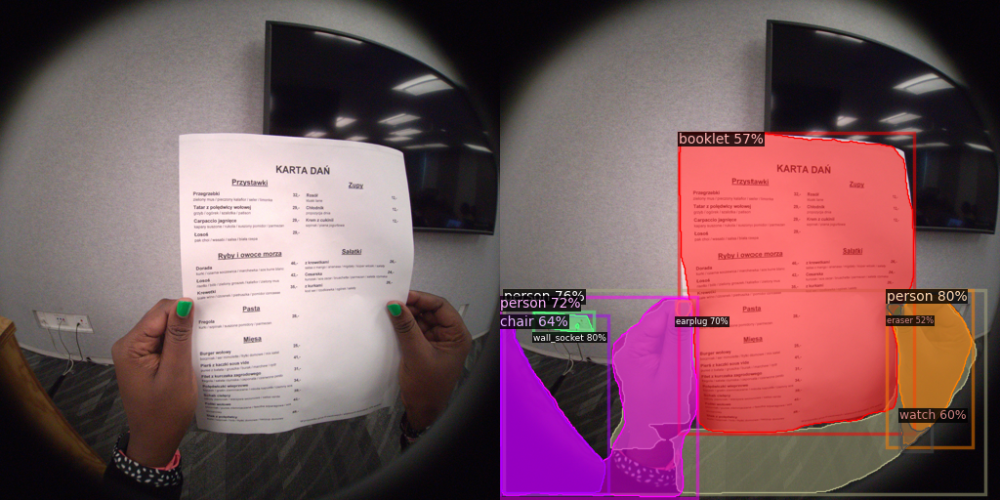

 10%|█         | 2/20 [00:08<01:06,  3.68s/it]

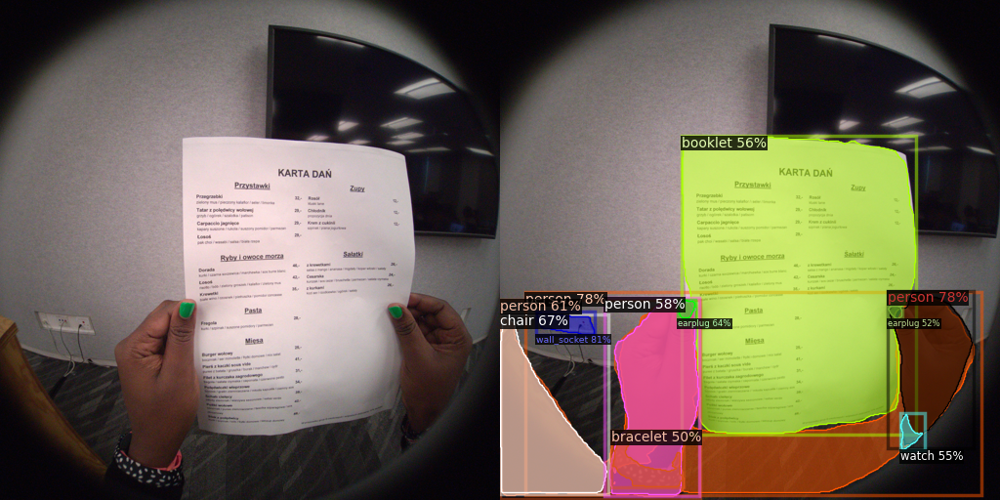

 15%|█▌        | 3/20 [00:09<00:40,  2.39s/it]

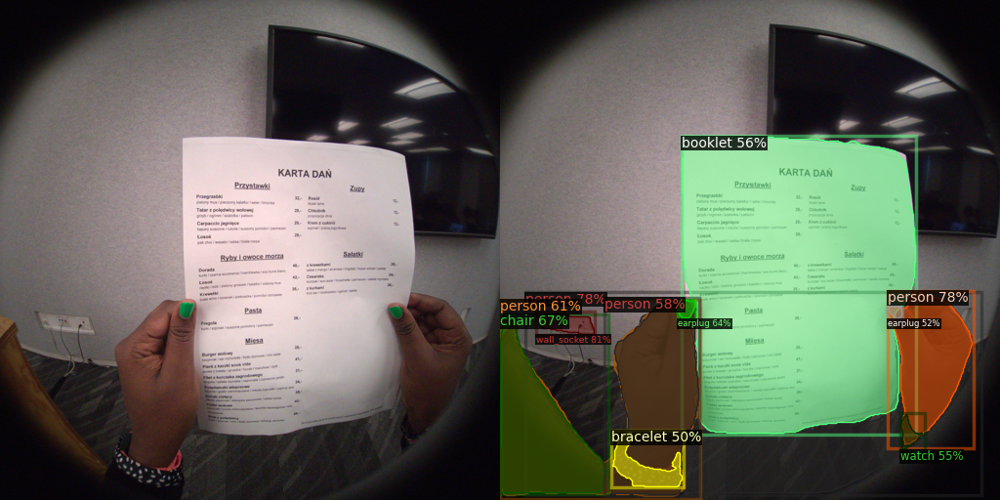

 20%|██        | 4/20 [00:10<00:28,  1.81s/it]

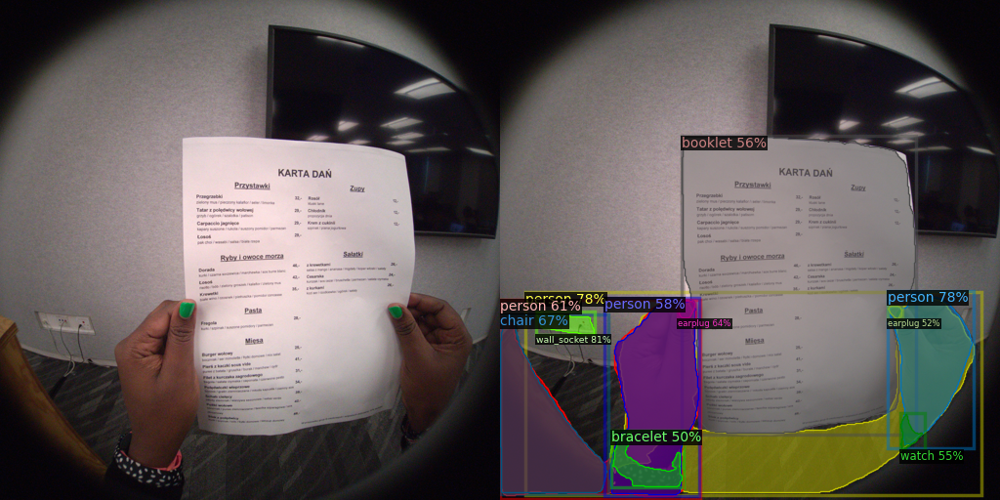

 25%|██▌       | 5/20 [00:11<00:22,  1.47s/it]

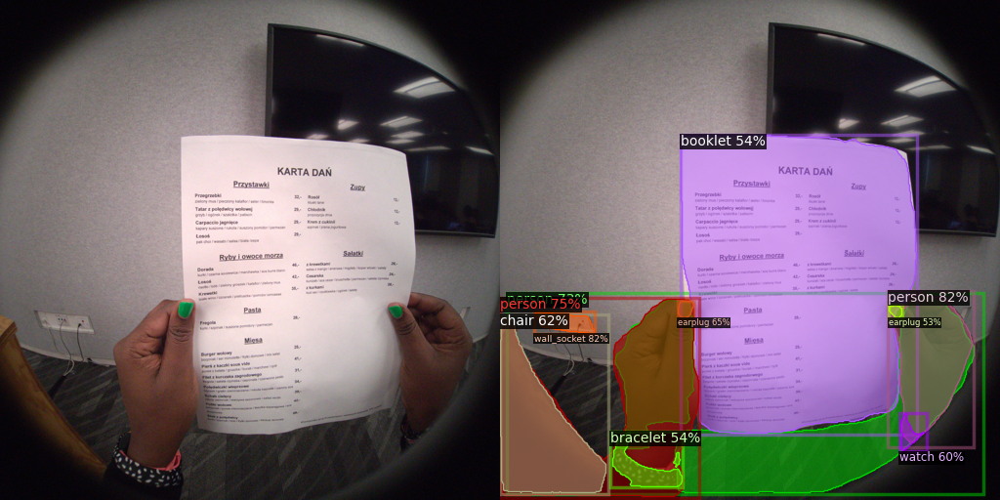

 30%|███       | 6/20 [00:12<00:17,  1.26s/it]

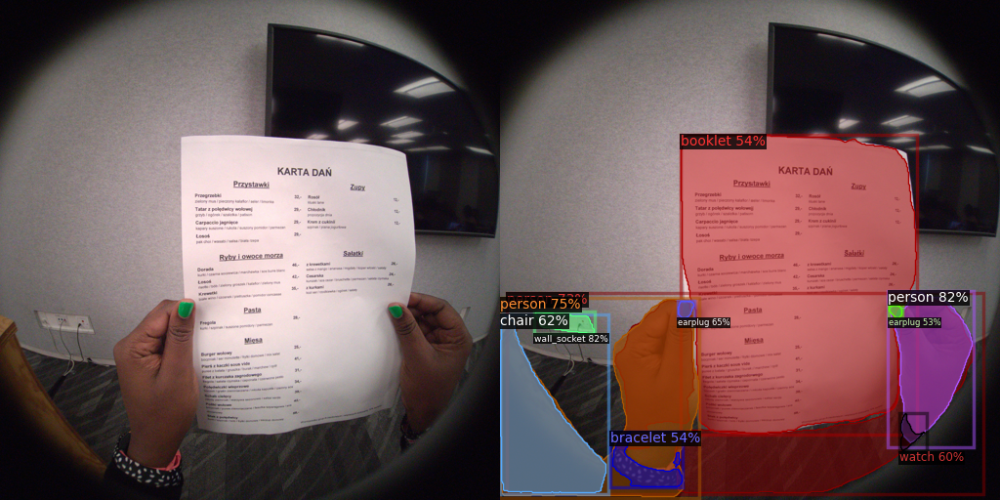

 35%|███▌      | 7/20 [00:13<00:15,  1.18s/it]

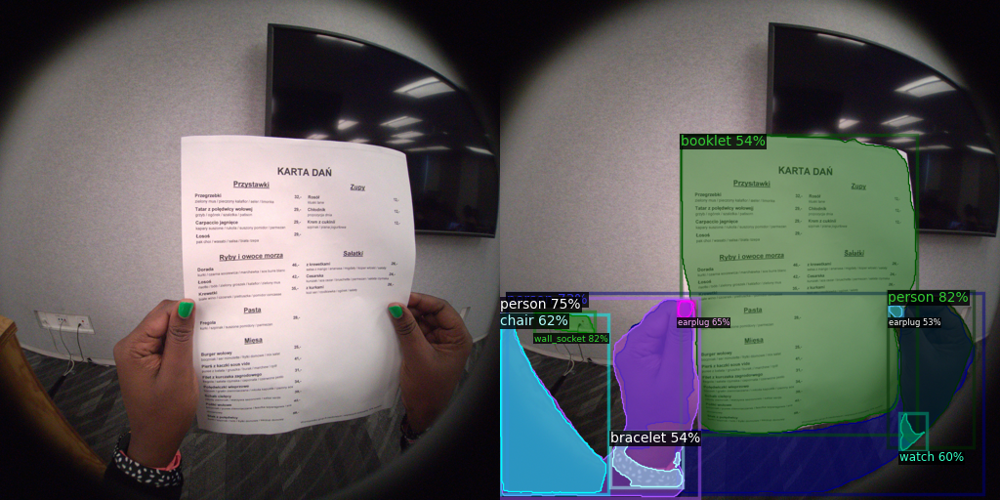

 40%|████      | 8/20 [00:14<00:13,  1.16s/it]

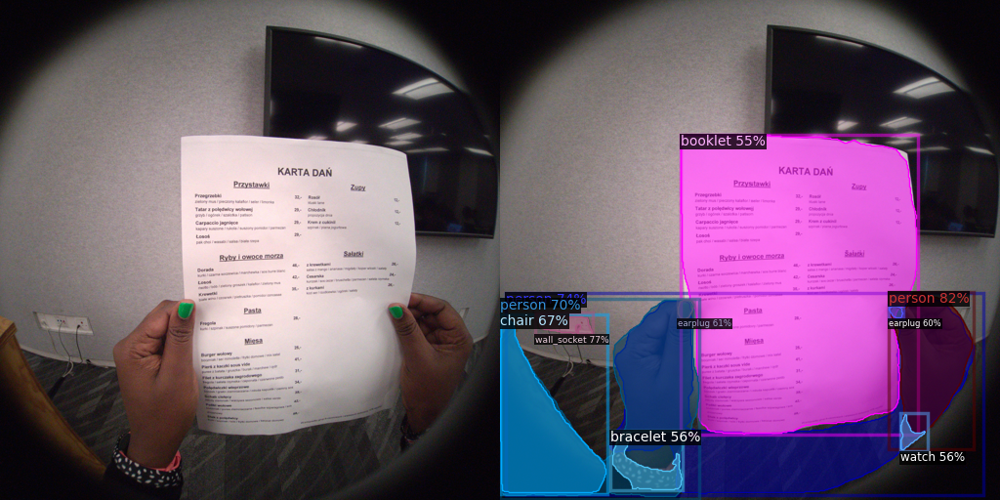

 45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

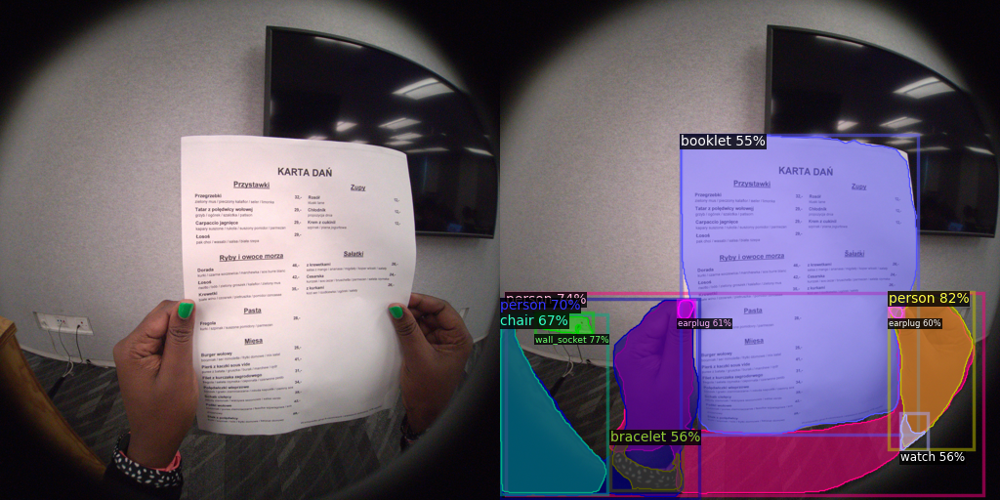

 50%|█████     | 10/20 [00:17<00:13,  1.39s/it]

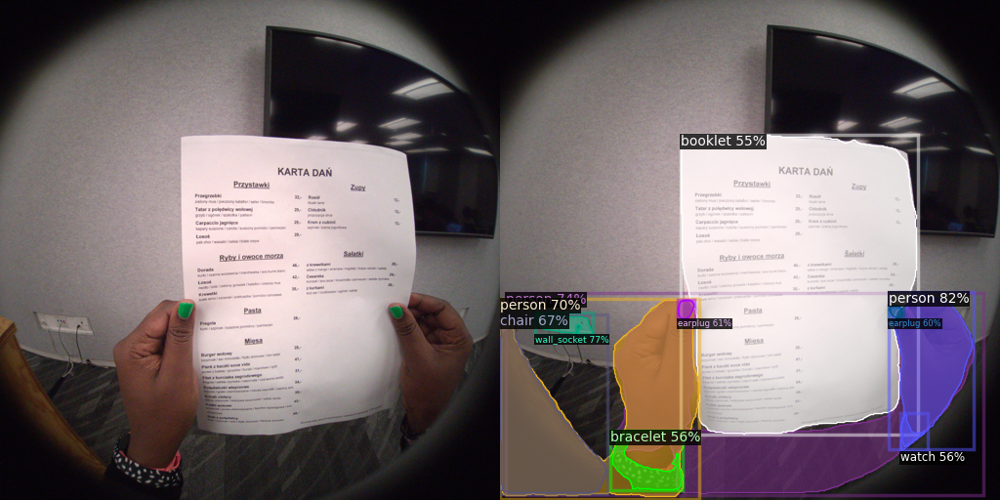

 55%|█████▌    | 11/20 [00:18<00:13,  1.50s/it]

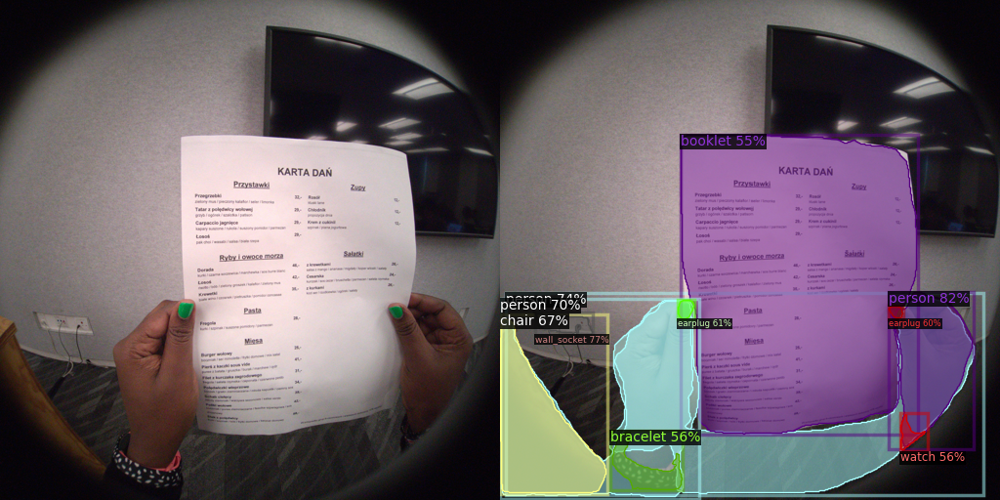

 60%|██████    | 12/20 [00:20<00:10,  1.36s/it]

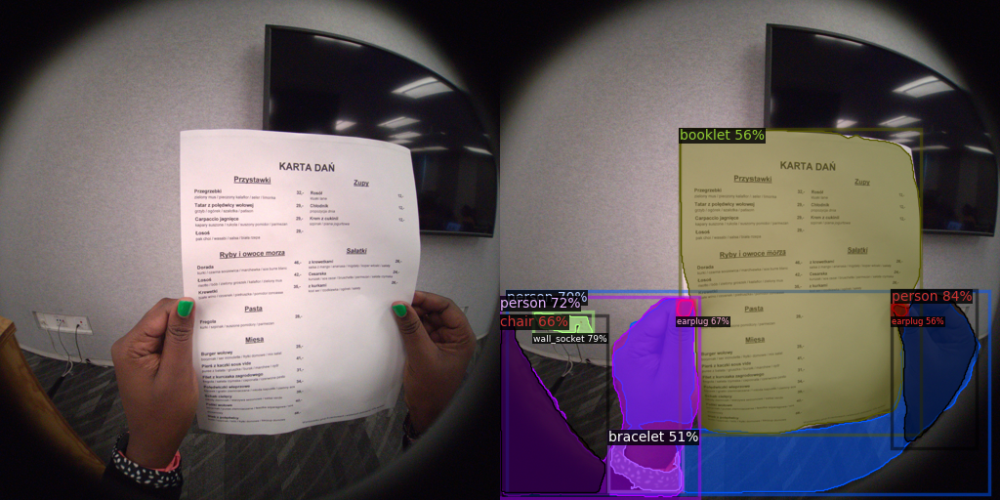

 65%|██████▌   | 13/20 [00:20<00:08,  1.21s/it]

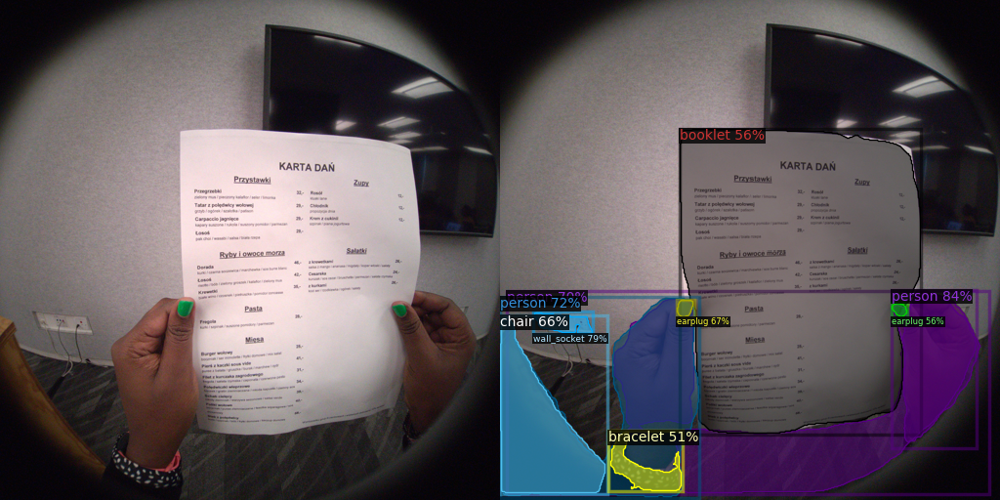

 70%|███████   | 14/20 [00:21<00:06,  1.11s/it]

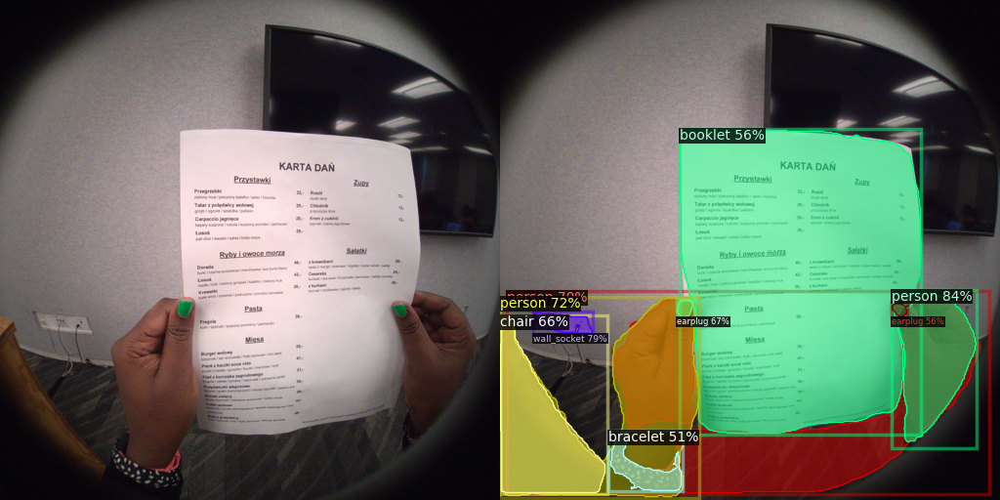

 75%|███████▌  | 15/20 [00:22<00:05,  1.04s/it]

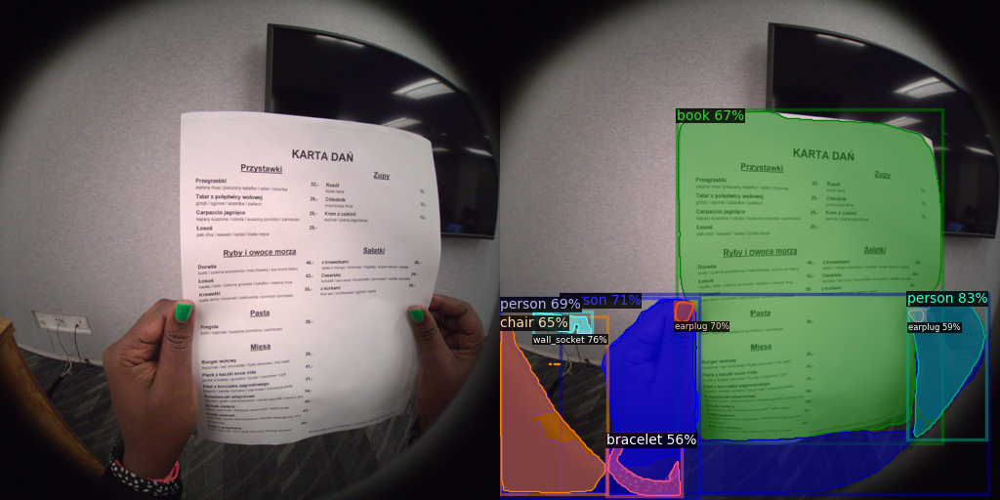

 80%|████████  | 16/20 [00:23<00:04,  1.06s/it]

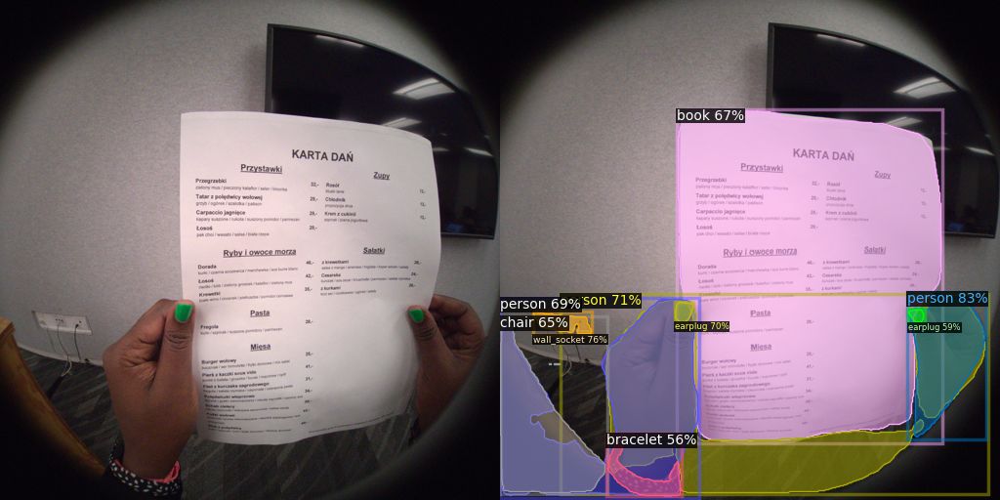

 85%|████████▌ | 17/20 [00:25<00:03,  1.28s/it]

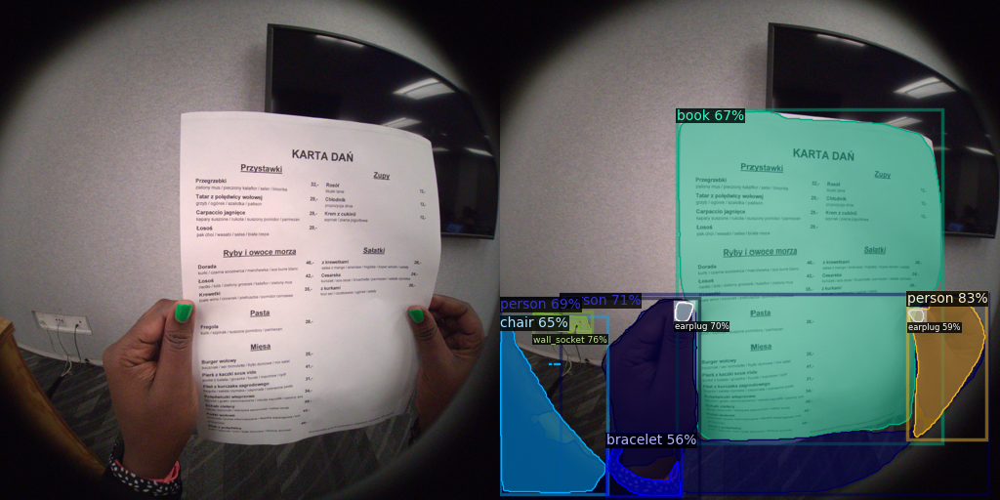

 90%|█████████ | 18/20 [00:27<00:02,  1.48s/it]

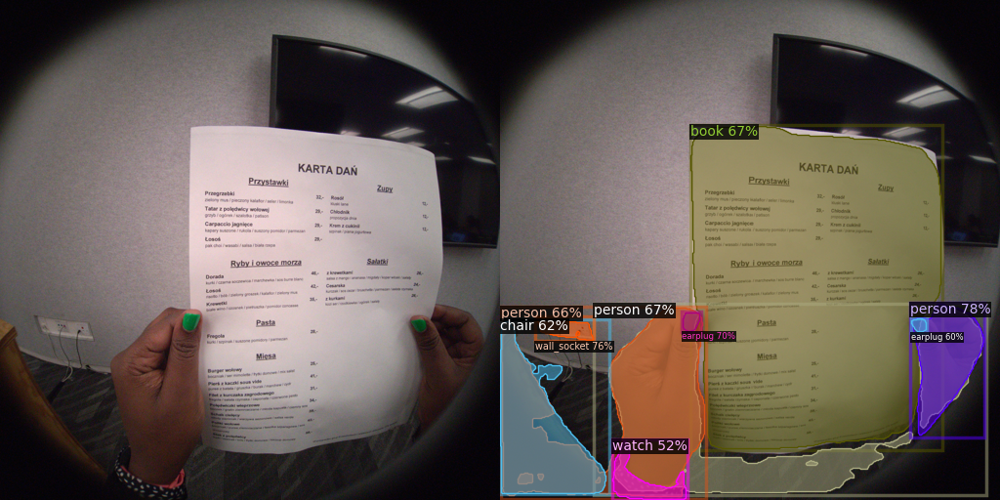

 95%|█████████▌| 19/20 [00:28<00:01,  1.49s/it]

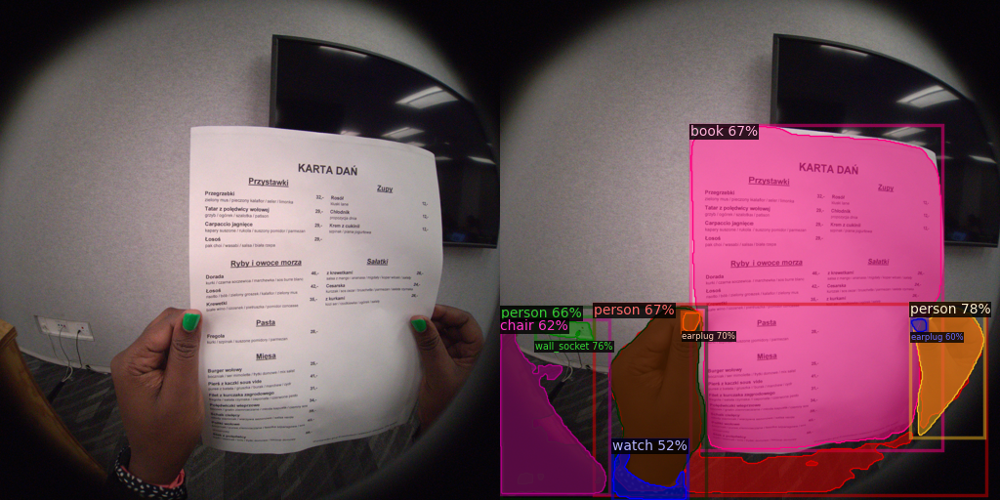

100%|██████████| 20/20 [00:32<00:00,  1.62s/it]


In [ ]:
from PIL import Image
imsize = 512

# Most menu cards were recognised as a book except one as a television_set
book_idx = 126
television_set = 1076
# Here choose the object type fro extracting the right object representing menu card
desired_idx = book_idx

objects_dict = {
    'timestamps': [],
    'objects': []
}

outputs_instances = []
imgs = []
imgs_numpy = []
menu_dist = []
for sample in tqdm(sample_timestamps):
    # Fetch image
    image_tuple = provider.get_image_data_by_time_ns(rgb_stream_id, int(sample), time_domain, option)
    image_array = image_tuple[0].to_numpy_array()
    image = Image.fromarray(image_array)
    img_org = image.copy().rotate(-90)
    new_size = (imsize, imsize)
    image = np.asarray(image.resize(new_size).rotate(-90))
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    imgs_numpy.append(image)
    # Run model and show results
    outputs = predictor(image)
    v = Visualizer(image[:, :, ::-1], metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    outputs_instances.append(outputs["instances"].to("cpu"))

    if desired_idx in outputs_instances[-1].pred_classes.tolist():
      # If there is a Menu card in the image we calculate and save distance to the list
      dist_from_center = get_distance(outputs_instances[-1], desired_idx)
      menu_dist.append(dist_from_center)
    else:
      # If there is no desired object (Menu card) we append 999 s a distance which is a large value that will not be considered asa smallest distance in the image
      menu_dist.append(999)

    output_image = out.get_image()[:, :, ::-1]

    object_list = list(set([metadata.thing_classes[x] for x in outputs["instances"].pred_classes.cpu().tolist()]))

    objects_dict['timestamps'].append(sample)
    objects_dict['objects'].append(object_list)

    combined_image = np.hstack((image, output_image))
    cv2_imshow(combined_image)
    imgs.append(img_org)


menu_dist = np.array(menu_dist)


# Extraction of the perfect frame

From given sequence of frames, we extract the image where the menu card is the most centered in the image. The image is saved in a google drive for OCR processing.

In [ ]:
min_indx = np.argmin(menu_dist)
# print(min_indx)
# cv2_imshow(imgs[min_indx])
my_vrs_file_path = 'AriaProject_Text-to-Taste/recordings/PolishMenu.png'
pth_to_save = "/content/drive/My Drive/" + my_vrs_file_path
imgs[min_indx].save(pth_to_save)

15
